# Task 4 : Location-based Analysis

**STEP-1 :** Explore the latitude and longitude coordinates of
the restaurants and visualize their distribution on a
map.

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import shutil
from IPython.display import display
from folium.plugins import MarkerCluster

df = pd.read_csv('C:/Users/AB/Desktop/internship/Dataset.csv')
print(" Dataset Loaded Successfully!")
print("\n First 5 Rows:")
display(df.head())

print("\nℹ Dataset Info:")
print(df.info())

if 'Latitude' in df.columns and 'Longitude' in df.columns:
    print("\n Latitude Summary:\n", df['Latitude'].describe())
    print("\n Longitude Summary:\n", df['Longitude'].describe())
else:
    print(" Latitude or Longitude column not found!")

df = df.dropna(subset=['Latitude', 'Longitude'])
print(f"\n Remaining Records After Dropping Missing Coordinates: {df.shape[0]}")

map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
restaurant_map = folium.Map(location=map_center, zoom_start=11)
marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"{row.get('Restaurant Name', 'Unknown')} | Rating: {row.get('Aggregate rating', 'N/A')}"
    ).add_to(marker_cluster)

print("\n Interactive Map of Restaurants:")
restaurant_map

 Dataset Loaded Successfully!

 First 5 Rows:


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229



ℹ Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Swit

**STEP-2 :** Group the restaurants by city or locality and
analyze the concentration of restaurants in
different areas.

 All Cities and Number of Restaurants:



,City,Number of Restaurants
0,New Delhi,5473
1,Gurgaon,1118
2,Noida,1080
3,Faridabad,251
4,Ghaziabad,25
...,...,...
136,Lakes Entrance,1
137,Mohali,1
138,Panchkula,1
139,Bandung,1


C:\Users\AB\AppData\Local\Temp\ipykernel_17964\3452267086.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=city_counts.head(10),


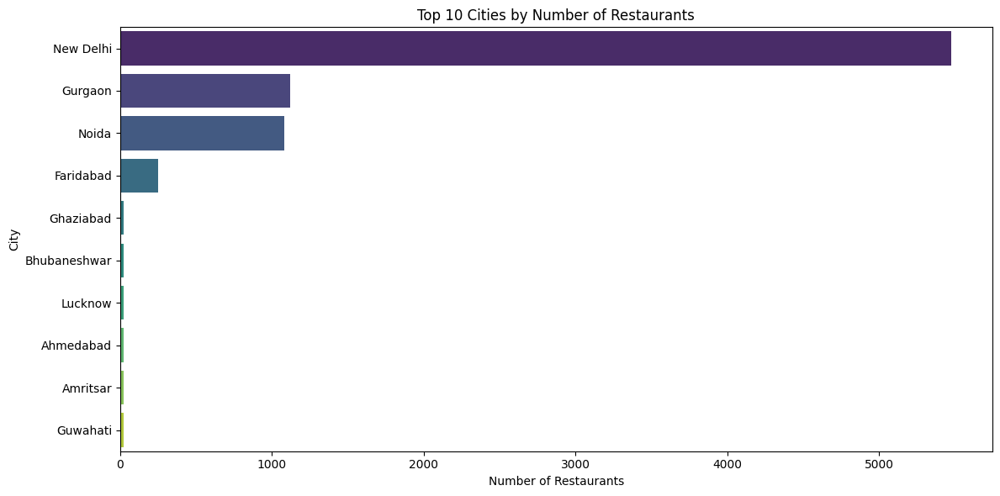

In [8]:
if 'City' in df.columns:
    city_counts = df['City'].value_counts().sort_values(ascending=False).reset_index()
    city_counts.columns = ['City', 'Number of Restaurants']

    print(" All Cities and Number of Restaurants:\n")
    display(city_counts)

    plt.figure(figsize=(12, 6))
    sns.barplot(data=city_counts.head(10),
                x='Number of Restaurants',
                y='City',
                palette='viridis')
    plt.title("Top 10 Cities by Number of Restaurants")
    plt.xlabel("Number of Restaurants")
    plt.ylabel("City")
    plt.tight_layout()
    plt.show()

elif 'Locality' in df.columns:
    locality_counts = df['Locality'].value_counts().sort_values(ascending=False).reset_index()
    locality_counts.columns = ['Locality', 'Number of Restaurants']

    print(" All Localities and Number of Restaurants:\n")
    display(locality_counts)

    top10_localities = locality_counts.head(10)
    plt.figure(figsize=(12, 6))
    sns.barplot(data=top10_localities,
                x='Number of Restaurants',
                y='Locality',
                palette='coolwarm')
    plt.title("Top 10 Localities by Number of Restaurants")
    plt.xlabel("Number of Restaurants")
    plt.ylabel("Locality")
    plt.tight_layout()
    plt.show()

else:
    print(" Neither 'City' nor 'Locality' columns are present in the dataset.")


**STEP-3 :** Calculate statistics such as the average ratings,
cuisines, or price ranges by city or locality.

In [15]:
import os 
df_clean = df.dropna(subset=['City', 'Aggregate rating', 'Average Cost for two', 'Cuisines'])

avg_rating = (
    df_clean.groupby('City')['Aggregate rating']
    .mean()
    .reset_index()
    .rename(columns={'Aggregate rating': 'Average Rating'})
)

avg_cost = (
    df_clean.groupby('City')['Average Cost for two']
    .mean()
    .reset_index()
    .rename(columns={'Average Cost for two': 'Average Cost for Two'})
)

def most_common(series):
    return series.mode().iloc[0] if not series.mode().empty else "N/A"

common_cuisine = (
    df_clean.groupby('City')['Cuisines']
    .agg(most_common)
    .reset_index()
    .rename(columns={'Cuisines': 'Most Common Cuisine'})
)

city_summary = avg_rating.merge(avg_cost, on='City').merge(common_cuisine, on='City')

city_summary_sorted = city_summary.sort_values(
    by=['Average Rating', 'Average Cost for Two'],
    ascending=[False, False]
).reset_index(drop=True)

print("Summary Statistics by City (Sorted Highest to Lowest):\n")
display(city_summary_sorted)

city_summary_sorted.to_csv(r"C:\Users\AB\Downloads\City_Statistics_Sorted.csv", index=False)
print("File saved to Downloads folder.")

Summary Statistics by City (Sorted Highest to Lowest):



,City,Average Rating,Average Cost for Two,Most Common Cuisine
0,Inner City,4.900000,1120.000000,"European, Contemporary"
1,Quezon City,4.800000,800.000000,"Filipino, Mexican"
2,Makati City,4.650000,1150.000000,"French, Japanese, Desserts"
3,Pasig City,4.633333,933.333333,"American, Ice Cream, Desserts"
4,Mandaluyong City,4.625000,2000.000000,Chinese
...,...,...,...,...
135,New Delhi,2.438845,596.088069,North Indian
136,Montville,2.400000,30.000000,"Coffee and Tea, Modern Australian"
137,Mc Millan,2.400000,10.000000,"Breakfast, Burger"
138,Noida,2.036204,539.490741,North Indian


File saved to Downloads folder.


**STEP-4 :** Identify any interesting insights or patterns related
to the locations of the restaurants.

In [17]:
city_counts = df['City'].value_counts().reset_index()
city_counts.columns = ['City', 'Number of Restaurants']

most_restaurants = city_counts.iloc[0]
least_restaurants = city_counts.iloc[-1]

print(" Restaurant Distribution:")
print(f" City with Most Restaurants: {most_restaurants['City']} ({most_restaurants['Number of Restaurants']})")
print(f" City with Least Restaurants: {least_restaurants['City']} ({least_restaurants['Number of Restaurants']})")

top_rated = city_summary_sorted[['City', 'Average Rating']].head(5)
low_rated = city_summary_sorted[['City', 'Average Rating']].tail(5)

print("\n Top 5 Highest Rated Cities:")
display(top_rated)

print("\n Bottom 5 Lowest Rated Cities:")
display(low_rated)

top_cost = city_summary_sorted[['City', 'Average Cost for Two']].sort_values(by='Average Cost for Two', ascending=False).head(5)

print("\n Top 5 Cities with Highest Average Cost for Two:")
display(top_cost)

top_cuisines = df['Cuisines'].dropna().apply(lambda x: x.split(',')[0].strip()).value_counts().head(10)

print("\n Top 10 Most Common Cuisines Across All Cities:")
display(top_cuisines)

foreign_cities = ['Jakarta', 'Tangerang', 'Bogor', 'Bandung', 'Pasay City', 'Doha']
intl_cost = city_summary_sorted[city_summary_sorted['City'].isin(foreign_cities)]

print("\n International Cities with High Average Cost and Global Cuisines:")
display(intl_cost[['City', 'Average Cost for Two', 'Most Common Cuisine']])

 Restaurant Distribution:
 City with Most Restaurants: New Delhi (5473)
 City with Least Restaurants: Randburg (1)

 Top 5 Highest Rated Cities:


,City,Average Rating
0,Inner City,4.900000
1,Quezon City,4.800000
2,Makati City,4.650000
3,Pasig City,4.633333
4,Mandaluyong City,4.625000



 Bottom 5 Lowest Rated Cities:


,City,Average Rating
135,New Delhi,2.438845
136,Montville,2.400000
137,Mc Millan,2.400000
138,Noida,2.036204
139,Faridabad,1.866932



 Top 5 Cities with Highest Average Cost for Two:


,City,Average Cost for Two
19,Jakarta,308437.500000
23,Tangerang,250000.000000
83,Bogor,160000.000000
41,Bandung,150000.000000
18,Pasay City,3333.333333



 Top 10 Most Common Cuisines Across All Cities:


Cuisines
North Indian    2992
Chinese          855
Fast Food        672
Bakery           621
Cafe             617
American         278
South Indian     262
Mithai           246
Street Food      236
Continental      235
Name: count, dtype: int64


 International Cities with High Average Cost and Global Cuisines:


,City,Average Cost for Two,Most Common Cuisine
18,Pasay City,3333.333333,"Asian, European"
19,Jakarta,308437.500000,"Seafood, Western"
23,Tangerang,250000.000000,Indonesian
41,Bandung,150000.000000,"Cafe, Coffee and Tea, Western"
64,Doha,223.750000,Indian
83,Bogor,160000.000000,"Cafe, Desserts, Beverages"
